In [9]:
import os
import sys
sys.path.insert(0, 'Users/tolmach/Documents/GitHub')
sys.path.insert(0, 'Users/tolmach/Documents/GitHub/PRuNNe/src')
sys.path.insert(0, 'Users/tolmach/Documents/GitHub/rnn_coach/src')
from copy import deepcopy
import torch
import numpy as np
from src.RNN_numpy import RNN_numpy
from src.PerformanceAnalyzer import PerformanceAnalyzerCDDM
from src.RNN_torch import RNN_torch
from src.Task import TaskCDDM
import pickle
import json
from pathlib import Path

from tqdm.auto import tqdm
from matplotlib import pyplot as plt
from scipy.stats import zscore
import pandas as pd
from sklearn.metrics import adjusted_rand_score as ARI
import warnings
warnings.filterwarnings("ignore")
from sklearn.cluster import KMeans, DBSCAN
from hdbscan import HDBSCAN
from sklearn.mixture import GaussianMixture as gm
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
from rnn_coach.src.utils import get_colormaps
np.set_printoptions(suppress = True)
colors, cmp = get_colormaps()

In [10]:
def permute_input_matrix(mat, order):
    new_mat = np.empty_like(mat)
    for i, r in enumerate(order):
        new_mat[i, :] = mat[r, :]
    return new_mat

def permute_output_matrix(mat, order):
    new_mat = np.empty_like(mat)
    for i, c in enumerate(order):
        new_mat[:, i] = mat[:, c]
    return new_mat

def permute_recurrent_matrix(mat, order):
    new_mat = permute_input_matrix(mat, order)
    new_mat = permute_output_matrix(new_mat, order)
    return new_mat

def bitstr(row: np.ndarray, th) -> str:
    return ''.join((row > th).astype(int).astype(str))

def get_ordering(W_inp, th=0.0):
    bitstrings = [(bitstr(W_inp[idx, :], th), idx) for idx in range(W_inp.shape[0])]
    bitstrings = sorted(bitstrings, key=lambda x: x[0], reverse=True)
    idxs = [idx for _, idx in bitstrings]
    return idxs

def plot_matrix(mat, vmin=None, vmax=None, show_numbers = False, figsize = (7,7)):
    if vmin is None:
        vmin = np.min(mat)
    if vmax is None:
        vmax = np.max(mat)    
    fig, ax = plt.subplots(1, 1, figsize = figsize)
    img = ax.imshow(mat, cmap=cmp, vmin = vmin, vmax = vmax)
    if show_numbers:
        for (i, j), z in np.ndenumerate(mat):
            if np.abs(z) > 0.01:
                ax.text(j, i, str(np.round(z, 2)), ha="center", va="center", color='k', fontsize=7)
    ax.set_xticks(np.arange(mat.shape[1])[::2])
    ax.set_yticks(np.arange(mat.shape[0])[::2])
    plt.show()
    
def take_elements(mat, inds_rows, inds_cols):
    mat = mat[inds_rows, :]
    return mat[:, inds_cols]

def plot_neurons_stats(neural_traces, conditions, task_params):
    # traces_nrn - matrix K x T, where K is the number of conditions, T - timesteps
    cue_on = task_params["cue_on"]
    cue_off = task_params["cue_off"]
    stim_on = task_params["stim_on"]
    stim_off = task_params["stim_off"]
    dec_on = task_params["dec_on"]
    dec_off = task_params["dec_off"]
    cohrences_list = task_params["coherences"]
    
    contexts = np.array([1 if d["context"]=='motion' else 0 for d in conditions])
    motion_coherences = np.array([d["motion_coh"] for d in conditions])
    color_coherences = np.array([d["color_coh"] for d in conditions])
    inds_motion_ctxt = np.where(contexts==1)[0]
    inds_color_ctxt = np.where(contexts==0)[0]

    data_dict = {}
    for ctx in ["motion", "color"]:
        val = 1 if ctx == 'motion' else 0
        inds_context = np.where(contexts==val)[0]
        for part in ["start", "end"]:
            if part == 'start':
                mfr = np.mean(neural_traces[inds_context, :stim_on], axis = 1)
            elif part == 'end':
                mfr = np.mean(neural_traces[inds_context, stim_on:], axis = 1)

            M = np.zeros((len(cohrences_list), len(cohrences_list)))
            for i in range(len(mfr)):
                coh_motion = np.take(motion_coherences, inds_context)[i]
                coh_color = np.take(color_coherences, inds_context)[i]
                i1 = np.where(cohrences_list == coh_motion)[0][0]
                i2 = np.where(cohrences_list == coh_color)[0][0]
                M[i1, i2] = mfr[i]
            data_dict[(ctx, part)] = deepcopy(M)
            
    figure, ax = plt.subplots(2, 2, figsize = (7, 7))
    plt.suptitle("Neural responses", fontsize = 16)
    imgs = []
    for i, ctx in enumerate(["motion", "color"]):
        for j, part in enumerate(["start", "end"]):
            imgs.append(ax[j, i].imshow(data_dict[(ctx, part)], cmap = 'coolwarm', interpolation='bicubic'))
            ax[j, i].set_xticks([])
            ax[j, i].set_yticks([])
    for i in range(2):
        ax[1, i].set_xlabel("Color", fontsize = 14)
        ax[i, 0].set_ylabel("Motion", fontsize = 14)
        ax[1, i].set_xticks(np.arange(len(cohrences_list)), cohrences_list, rotation = 50, fontsize = 7)
        ax[i, 0].set_yticks(np.arange(len(cohrences_list)), cohrences_list, rotation = 50, fontsize = 7)
    cnt = 0
    for i, ctx in enumerate(["motion", "color"]):
        for j, part in enumerate(["start", "end"]):        
            figure.colorbar(imgs[cnt], ax=ax[j, i], cax=ax[j, i].inset_axes([1.05, 0, 0.05, 1]))
            cnt+=1

    plt.subplots_adjust(hspace = 0.0, wspace = 0.35)
    plt.show()


In [27]:
projects_folder = str(Path.home()) + "/Documents/GitHub/"
activation = 'tanh'
RNN_folder = "0.011634_CDDM;tanh;N=100;lmbdo=0.3;lmbdr=0.5;lr=0.005;maxiter=1500"
RNNs_path = os.path.join(projects_folder, "rnn_coach", "data", "trained_RNNs", "CDDM")
RNN_score = float(RNN_folder.split("_")[0])
RNN_path = os.path.join(RNNs_path, RNN_folder)
rnn_config = json.load(open(os.path.join(RNN_path, f"{RNN_score}_config.json"), "rb+"))
rnn_data = json.load(open(os.path.join(RNN_path, f"{RNN_score}_params_CDDM.json"), "rb+"))
train_config_file = f"train_config_CDDM_tanh;N=100;lmbdr=0.5;lmbdo=0.3.json"

activation_name = rnn_config["activation"]
RNN_N = rnn_config["N"]
n_steps = rnn_config["n_steps"]
task_params = rnn_config["task_params"]
activation_torch = lambda x: torch.maximum(x, torch.tensor(0))
dt = rnn_config["dt"]
tau = rnn_config["tau"]
connectivity_density_rec = rnn_config["connectivity_density_rec"]
spectral_rad = rnn_config["sr"]
sigma_inp = 0.03
sigma_rec = 0.03
seed = np.random.randint(1000000)


print(f"seed: {seed}")
device = torch.device('cpu')
rng = torch.Generator(device=torch.device(device))
if not seed is None:
    rng.manual_seed(seed)
input_size = np.array(rnn_data["W_inp"]).shape[1]
output_size = np.array(rnn_data["W_out"]).shape[0]
mask = np.array(rnn_config["mask"])

seed: 410264


In [28]:
N = rnn_data["N"]
dt = rnn_data["dt"]
tau = rnn_data["tau"]
W_inp = np.array(rnn_data["W_inp"])
W_rec = np.array(rnn_data["W_rec"])
W_out = np.array(rnn_data["W_out"])
N = W_rec.shape[0]
activation_numpy = lambda x: np.tanh(x)

In [29]:
task_params_ = deepcopy(task_params)
task_params_["coherences"] = np.array([-0.8, -0.5, -0.2, -0.1, 0, 0.1, 0.2, 0.5, 0.8])

In [30]:
task_params

{'cue_on': 0,
 'cue_off': 300,
 'stim_on': 100,
 'stim_off': 300,
 'dec_on': 200,
 'dec_off': 300,
 'n_steps': 300,
 'n_inputs': 6,
 'n_outputs': 2,
 'coherences': [-1.0,
  -0.5,
  -0.25,
  -0.125,
  -0.0625,
  -0.03125,
  -0.015625,
  0.0,
  0.015625,
  0.03125,
  0.0625,
  0.125,
  0.25,
  0.5,
  1.0],
 'seed': 339320}

In [31]:
# set up torch RNN
RNN = RNN_numpy(N=N,
                dt=dt, tau=tau,
                W_inp=W_inp,
                W_rec=W_rec,
                W_out=W_out,
                activation=activation_numpy)
task = TaskCDDM(n_steps=n_steps, n_inputs=input_size, n_outputs=output_size, task_params=task_params_)
inputs, targets, conditions = task.get_batch()

In [32]:
F_connectivity = np.zeros((N, 1 + 2*N + 2 + 6))    
for i in range(N):
    F_connectivity[i, 0] = np.sign(np.mean(W_rec[:, i]))
    F_connectivity[i, 1:] = np.concatenate([W_rec[:, i], W_rec[i, :], W_out[:, i], W_inp[i, :]])

In [33]:
RNN.clear_history()        
RNN.run(inputs, sigma_rec=0, sigma_inp=0)
traces = RNN.get_history()
cue_on = task_params["cue_on"]
cue_off = task_params["cue_off"]
stim_on = task_params["stim_on"]
stim_off = task_params["stim_off"]
dec_on = task_params["dec_on"]
dec_off = task_params["dec_off"]
times = np.unique([cue_on, cue_off, stim_on, stim_off, dec_on, dec_off])
times.sort()
F_activity = np.stack([np.mean(traces[:, times[0]:times[1], :], axis=1),
                       np.mean(traces[:, times[1]:times[2], :], axis=1),
                       np.mean(traces[:, times[2]:times[3], :], axis=1)], axis = 1)
F_activity = np.hstack([F_activity[:, i, :] for i in range(F_activity.shape[1])])

In [34]:
F = np.hstack([F_activity, F_connectivity])
F_z = zscore(F, axis = 0)

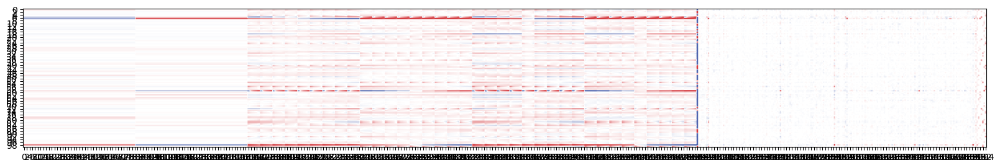

In [35]:
plot_matrix(F, figsize=(20, 5), vmin = -1, vmax = 1)

# clustering neurons based on their activity:

In [37]:
F_z_activity = zscore(F_activity, axis = 0)
F_z_connectivity = zscore(F_connectivity, axis = 0)
F_z = np.hstack([F_z_activity, F_z_connectivity])

In [64]:
from sklearn.decomposition import PCA
pca = PCA(n_components=5)
pca.fit(F_z_activity)
F_z_activity_pca = (F_z_activity @ pca.components_.T)

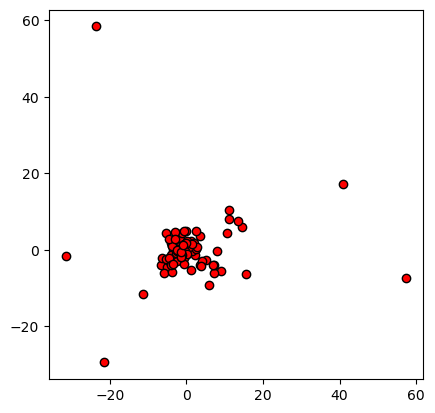

In [71]:
fig, ax = plt.subplots(1, 1)

ax.scatter(F_z_activity_pca[:, 1], F_z_activity_pca[:, 2], marker='o', color='r', edgecolors='k')
ax.axes.set_aspect('equal')
plt.show()

In [38]:
L = 20
num_rep = 3
sill_score_array = np.zeros((L-2, num_rep))
for j in range(num_rep):
    for i in range(2, L):
        clusterer = KMeans(n_clusters = i)
        labels = clusterer.fit_predict(F_z_activity)
        sill_score_array[i-2, j] = deepcopy(silhouette_score(F_z_activity, labels))
sill_scores = np.mean(sill_score_array, axis=1)

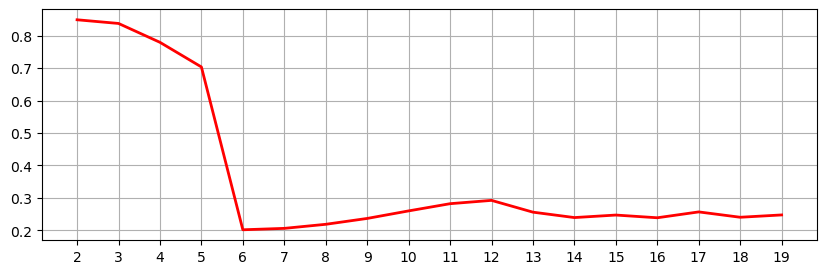

In [39]:
fig, ax = plt.subplots(figsize = (10, 3))
ax.plot(sill_scores, linewidth=2, color='r')
ax.set_xticks(np.arange(L-2))
ax.set_xticklabels(labels = np.arange(2, L))
plt.grid(True)
plt.show()

In [42]:
clusterer = KMeans(n_clusters = 8)
# clusterer = HDBSCAN()
labels = clusterer.fit_predict(F_z_activity)

_____________________
0


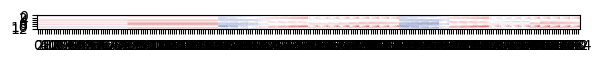

_____________________
1


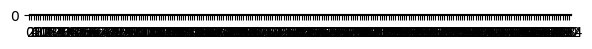

_____________________
2


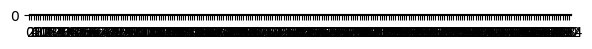

_____________________
3


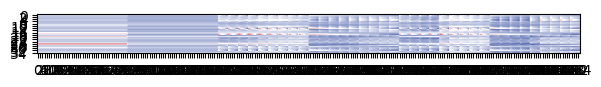

_____________________
4


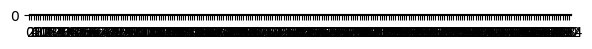

_____________________
5


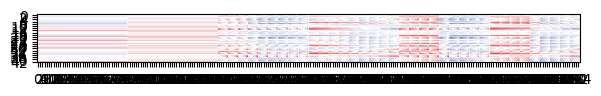

_____________________
6


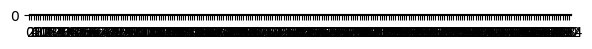

_____________________
7


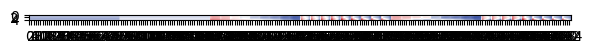

In [43]:
for i in np.unique(labels):
    print("_____________________")
    print(i)
    plot_matrix(F_z_activity[np.where(labels == i)[0],:])

In [46]:
F_z_connectivity.shape

(100, 209)

1


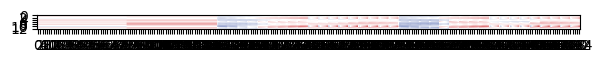

1


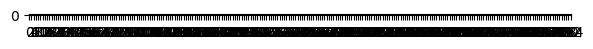

3


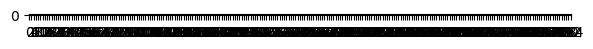

0


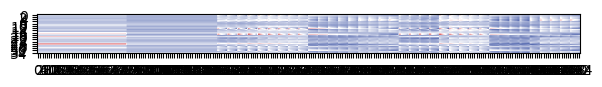

4


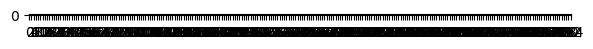

1000


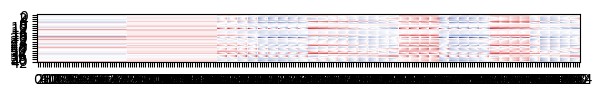

2


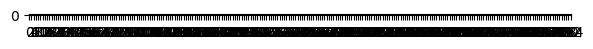

3


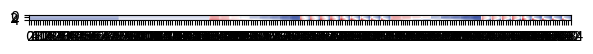

In [48]:
th = 0.2 #if the input this neuron receives is lower than the threshold - consider that it receives no input
label_dict = dict()
for i in range(6):
    label_dict[i] = []
label_dict[1000] = []
    
for i in np.unique(labels):
    row = np.mean(F_z_connectivity[np.where(labels == i)[0],-6:], axis = 0)
    row = row * (row > th)

    if np.max(row) == 0:
        inp_ind = 1000
    else:
        inp_ind = np.argmax(row)
        
    print(inp_ind)
    plot_matrix(F_z_activity[:, 1:][np.where(labels == i)[0],:])
    label_dict[inp_ind].append(np.where(labels == i)[0])

In [49]:
label_dict

{0: [array([ 0,  1,  5,  9, 12, 16, 20, 21, 26, 27, 28, 31, 34, 41, 42, 46, 47,
         48, 56, 63, 65, 66, 67, 68, 76, 77, 78, 79, 80, 83, 86, 89, 92, 96,
         97])],
 1: [array([18, 22, 29, 37, 39, 40, 44, 60, 62, 64, 72, 84, 93]), array([7])],
 2: [array([6])],
 3: [array([98]), array([32, 53, 81, 82, 99])],
 4: [array([59])],
 5: [],
 1000: [array([ 2,  3,  4,  8, 10, 11, 13, 14, 15, 17, 19, 23, 24, 25, 30, 33, 35,
         36, 38, 43, 45, 49, 50, 51, 52, 54, 55, 57, 58, 61, 69, 70, 71, 73,
         74, 75, 85, 87, 88, 90, 91, 94, 95])]}

In [50]:
label_dict
keys = list(label_dict.keys())
keys.sort()
order = np.array([])
labels = np.zeros(N).astype(int)
c = 0
for key in keys:
    for i in range(len(label_dict[key])):
        labels[label_dict[key][i]] = int(c)
        order = np.append(order, label_dict[key][i])
        c += 1
order = order.astype("int")

In [51]:
order

array([ 0,  1,  5,  9, 12, 16, 20, 21, 26, 27, 28, 31, 34, 41, 42, 46, 47,
       48, 56, 63, 65, 66, 67, 68, 76, 77, 78, 79, 80, 83, 86, 89, 92, 96,
       97, 18, 22, 29, 37, 39, 40, 44, 60, 62, 64, 72, 84, 93,  7,  6, 98,
       32, 53, 81, 82, 99, 59,  2,  3,  4,  8, 10, 11, 13, 14, 15, 17, 19,
       23, 24, 25, 30, 33, 35, 36, 38, 43, 45, 49, 50, 51, 52, 54, 55, 57,
       58, 61, 69, 70, 71, 73, 74, 75, 85, 87, 88, 90, 91, 94, 95])

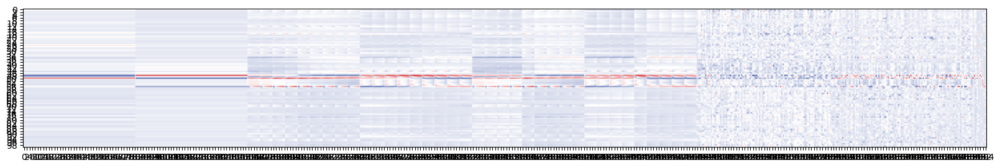

In [52]:
F_z_permuted = permute_input_matrix(F_z, order)
plot_matrix(F_z_permuted, figsize=(20, 5))

In [53]:
cue_on = task_params["cue_on"]
cue_off = task_params["cue_off"]
stim_on = task_params["stim_on"]
stim_off = task_params["stim_off"]
dec_on = task_params["dec_on"]
dec_off = task_params["dec_off"]
times = np.unique([cue_on, cue_off, stim_on, stim_off, dec_on, dec_off])
times.sort()
F_activity = np.stack([np.mean(traces[:, times[0]:times[1], :], axis=1),
                       np.mean(traces[:, times[1]:times[2], :], axis=1),
                       np.mean(traces[:, times[2]:times[3], :], axis=1)], axis=1)
F_activity = np.hstack([F_activity[:, i, :] for i in range(F_activity.shape[1])])

features = (F_activity.T / np.linalg.norm(F_activity, axis=1)).T
sim_score_mat = features @ features.T - np.eye(RNN.N)

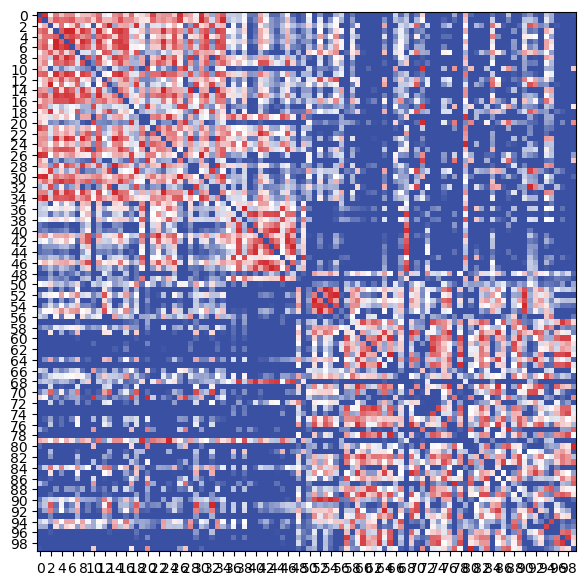

0.9929724474173396


In [54]:
plot_matrix(take_elements(sim_score_mat, order, order), vmin = 0, vmax=1)
print(np.max(sim_score_mat))

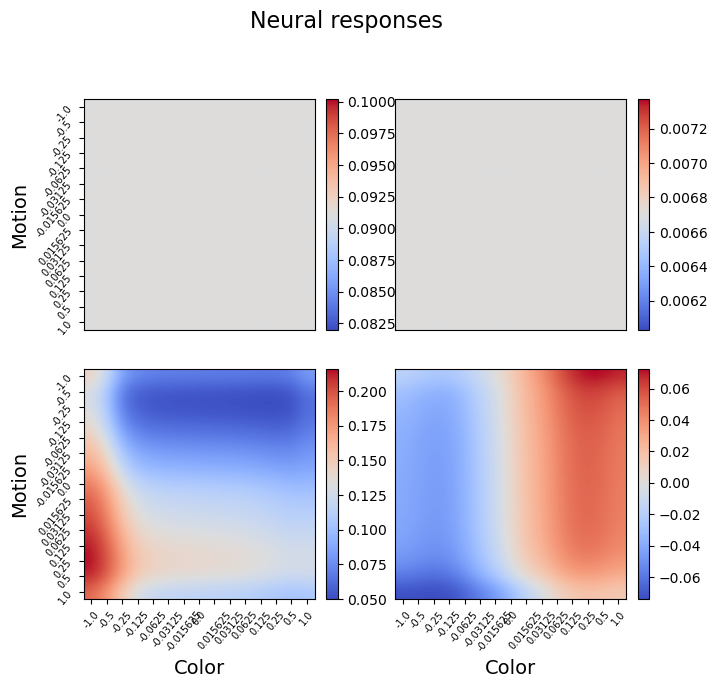

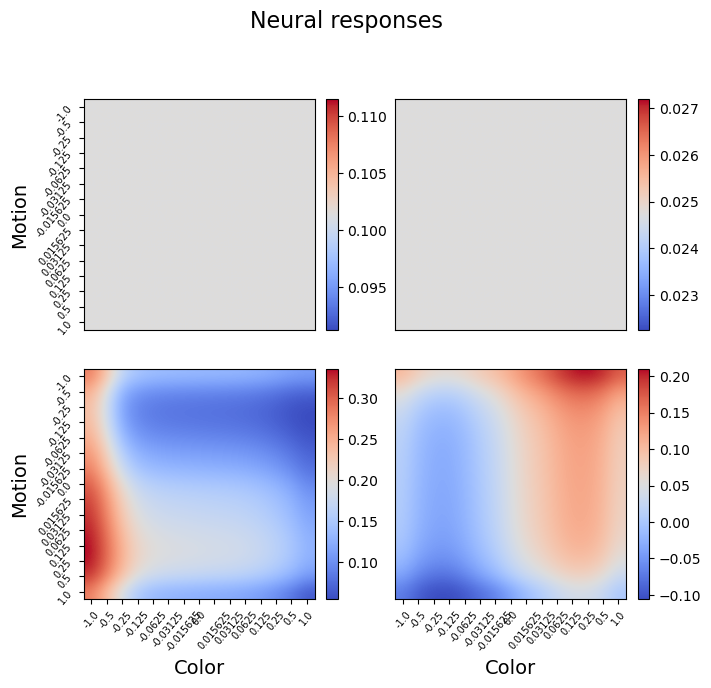

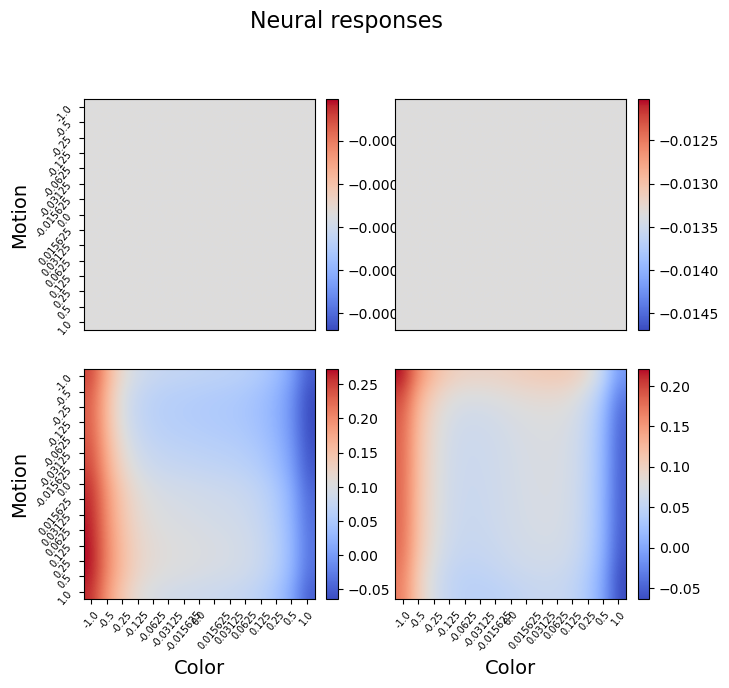

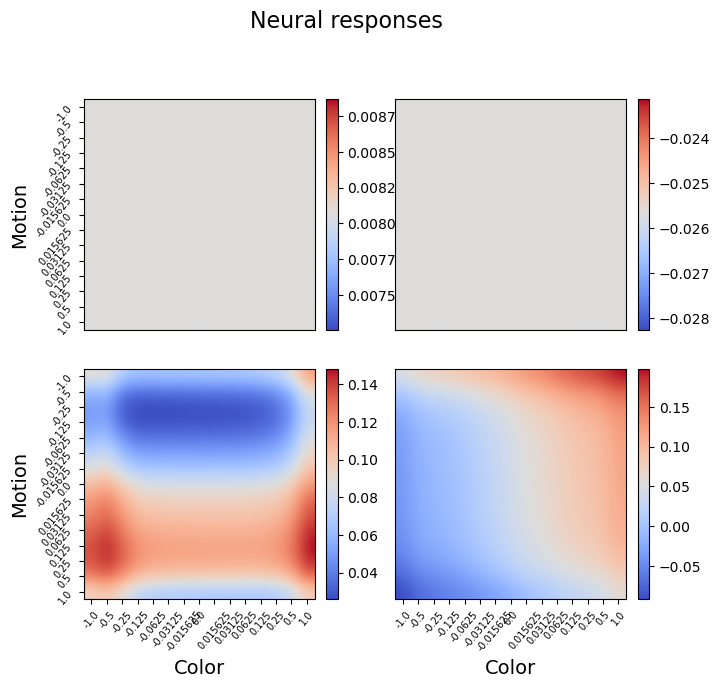

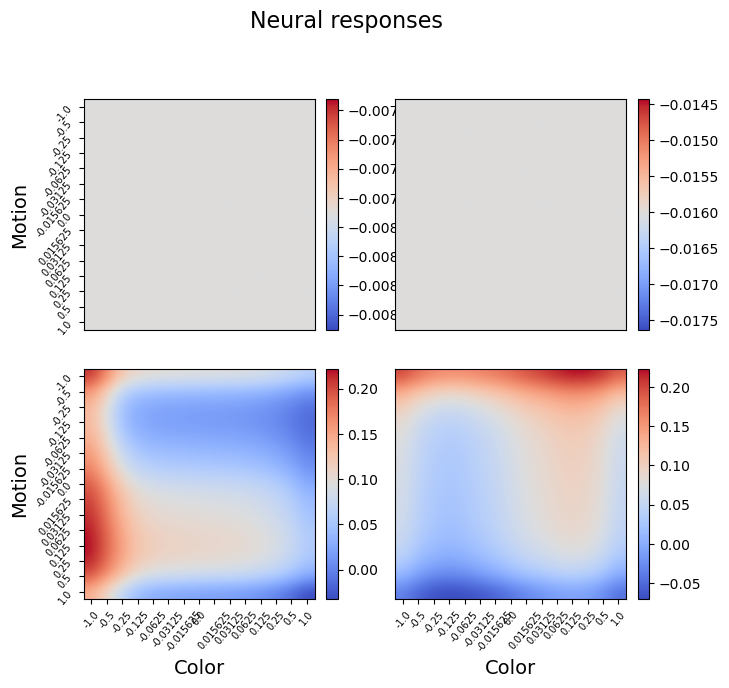

...

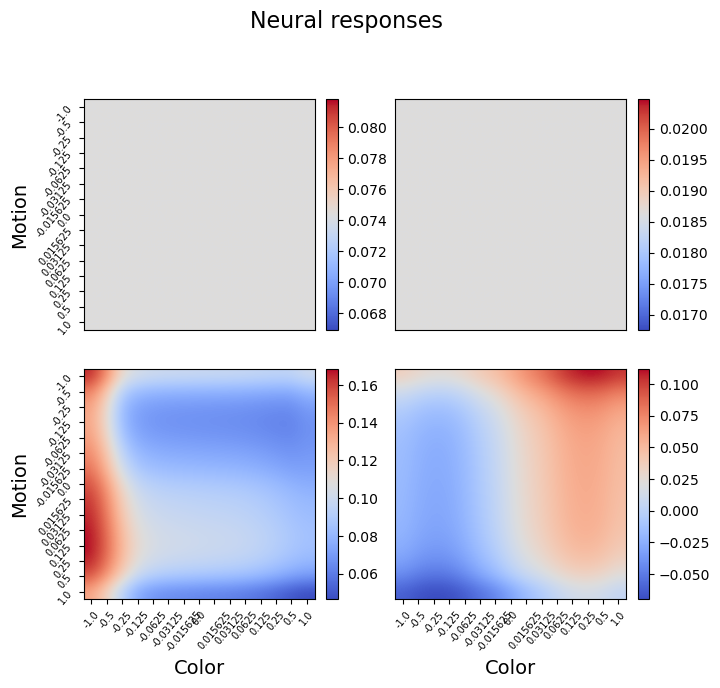

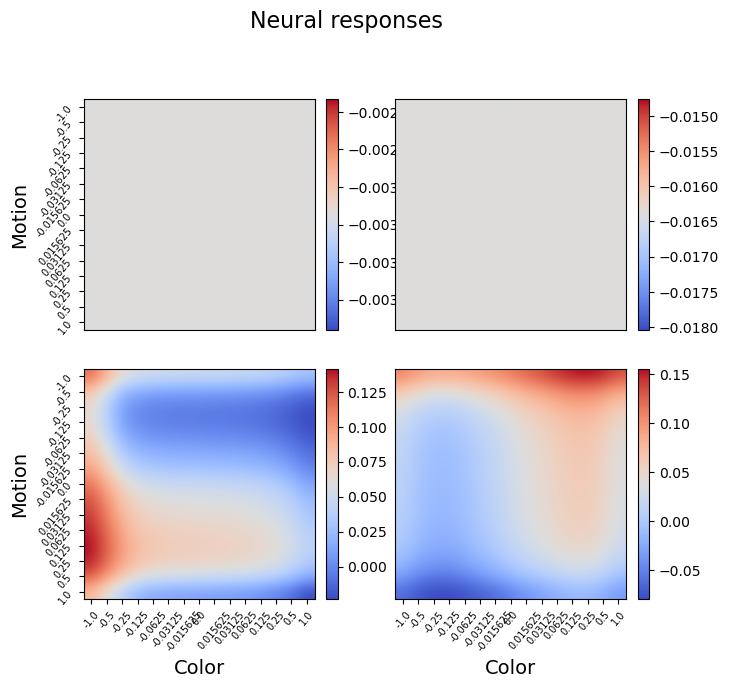

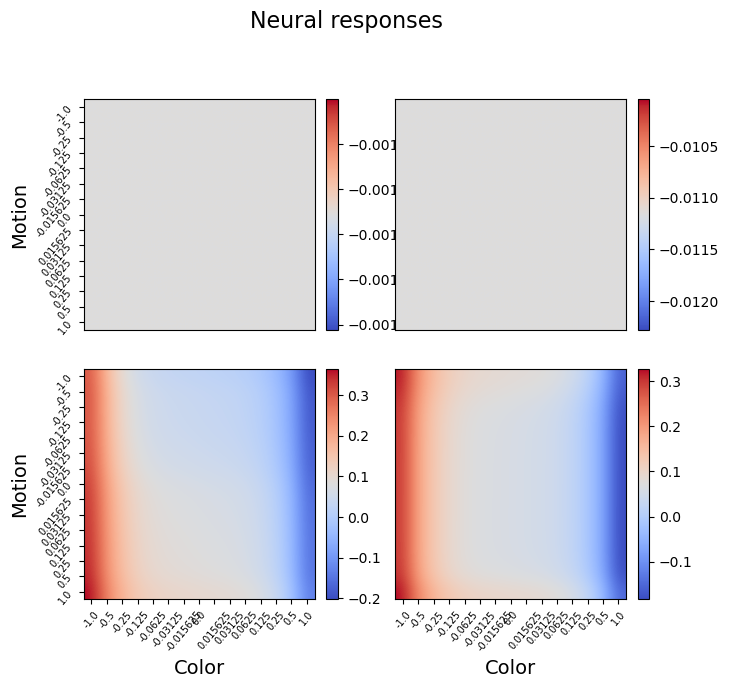

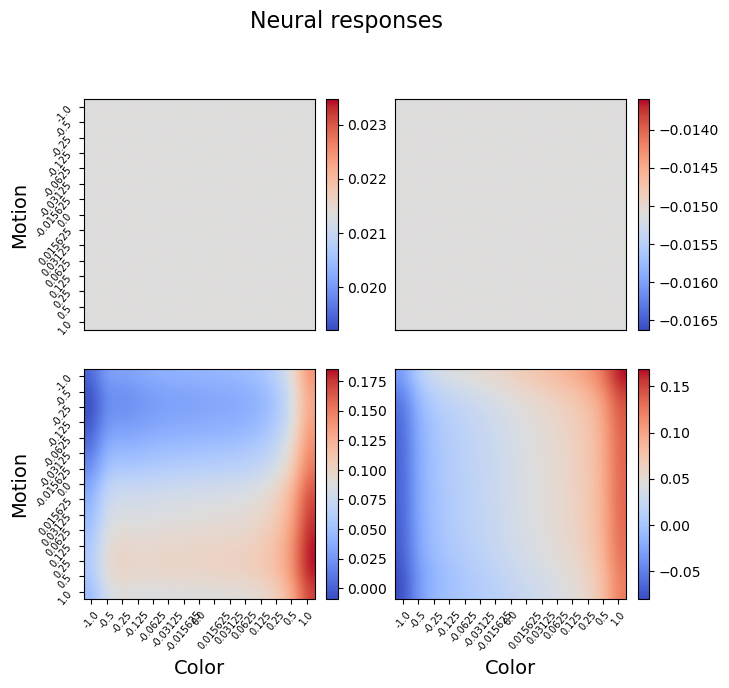

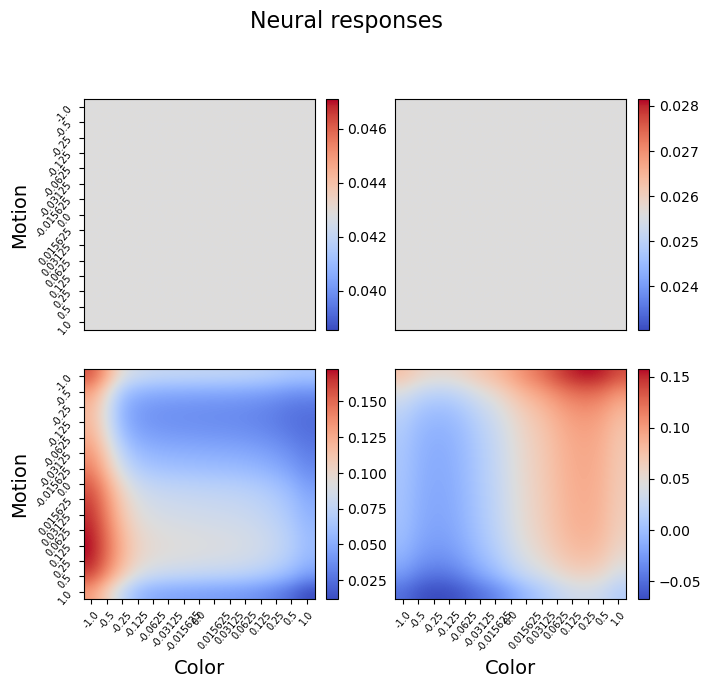

In [56]:
# set up torch RNN
RNN = RNN_numpy(N=N,
                dt=dt, tau=tau,
                W_inp=W_inp,
                W_rec=W_rec,
                W_out=W_out,
                activation=activation_numpy)
task = TaskCDDM(n_steps=n_steps, n_inputs=input_size, n_outputs=output_size, task_params=task_params)
inputs, targets, conditions = task.get_batch()
RNN.clear_history()        
RNN.run(inputs, sigma_rec=0, sigma_inp=0)
traces = RNN.get_history()
for i in label_dict[0][0]:
    plot_neurons_stats(traces[i, ...].T, conditions=conditions, task_params=task_params)


In [57]:
from sklearn.decomposition import PCA
pca = PCA(n_components=5)
pca.fit(F_z)
F_z_pca = (F_z @ pca.components_.T)

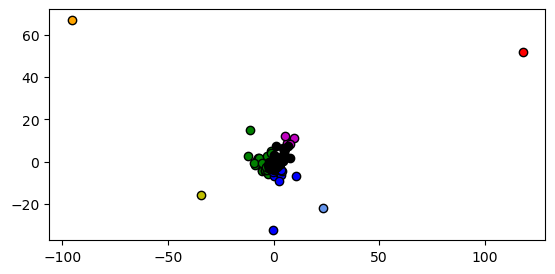

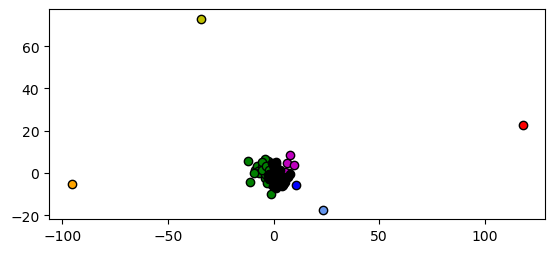

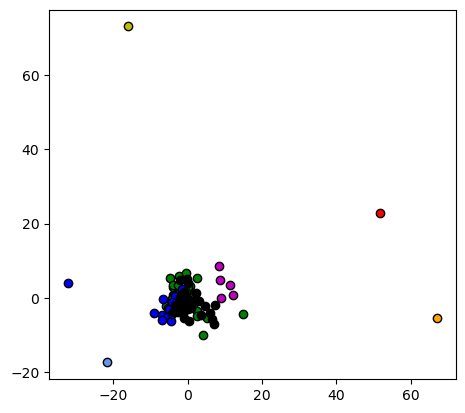

In [58]:
colors = ["g", 'b', 'r', "cornflowerblue", "orange", "m", "y", "k", "violet", "deepskyblue"]
fig, ax = plt.subplots(1, 1)
for i in (np.unique(labels)):
    cluster = np.where(labels == i)[0]
    ax.scatter(F_z_pca[cluster, 0], F_z_pca[cluster, 1], marker='o', color=colors[i], edgecolors='k')
ax.axes.set_aspect('equal')
plt.show()

fig, ax = plt.subplots()
for i in (np.unique(labels)):
    cluster = np.where(labels == i)[0]
    ax.scatter(F_z_pca[cluster, 0], F_z_pca[cluster, 2], marker='o', color=colors[i], edgecolors='k')
ax.axes.set_aspect('equal')
plt.show()

fig, ax = plt.subplots()
for i in (np.unique(labels)):
    cluster = np.where(labels == i)[0]
    ax.scatter(F_z_pca[cluster, 1], F_z_pca[cluster, 2], marker='o', color=colors[i], edgecolors='k')
ax.axes.set_aspect('equal')
plt.show()

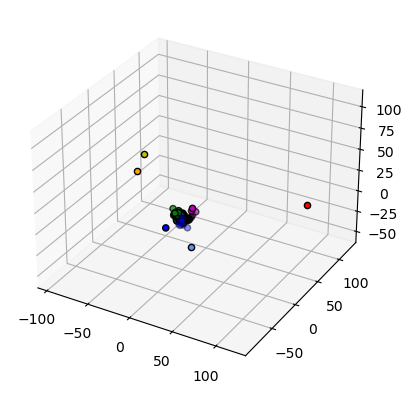

In [59]:
# %matplotlib widget
colors = ["g", 'b', 'r', "cornflowerblue", "orange", "m", "y", "k", "violet", "deepskyblue"]
fig = plt.figure()
ax = plt.axes(projection='3d')
for i in (np.unique(labels)):
    cluster = np.where(labels == i)[0]
    ax.scatter(F_z_pca[cluster, 0], F_z_pca[cluster, 1],F_z_pca[cluster, 2], marker='o', color=colors[i], edgecolors='k')
ax.axes.set_aspect('equal')
plt.show()


In [60]:
W_inp_permuted = permute_input_matrix(W_inp, order)
W_rec_permuted = permute_recurrent_matrix(W_rec, order)
W_out_permuted = permute_output_matrix(W_out, order)

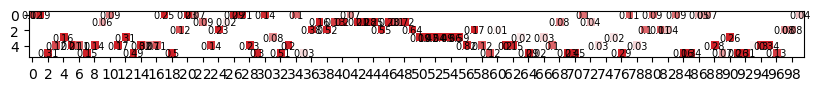

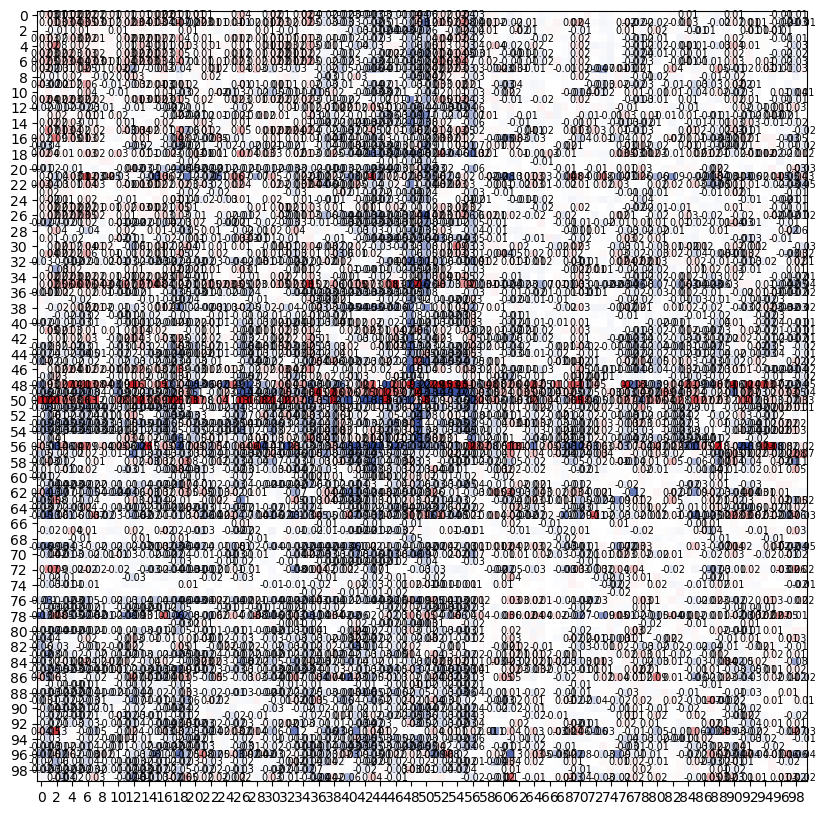

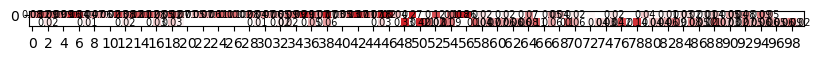

In [61]:
show_numbers=True
plot_matrix(W_inp_permuted.T, vmin = -0.15, vmax = 0.15, figsize = (10, 10), show_numbers=show_numbers)
plot_matrix(W_rec_permuted, vmin = -0.15, vmax = 0.15, figsize = (10, 10), show_numbers=show_numbers)
plot_matrix(W_out_permuted, vmin = -0.15, vmax = 0.15, figsize = (10, 10), show_numbers=show_numbers)

In [838]:
r = 50

# clusters = ["ctxM_inh", 'ctxM_exc','ctxC_inh',"ctxC_exc", "mR", "mL", "cR", "cL", "sens_inh", "weird"]
clusters = ["ctxM_inh", 'ctxC_inh', "mR", "mL", "cR", "cL", "sens_inh"]#, "weird"]
W_rec_effective = np.zeros((len(clusters), len(clusters)))
for i, cluster1 in enumerate(clusters):
    for j, cluster2 in enumerate(clusters):
        inds_cluster1 = np.where(labels == clusters.index(cluster1))[0]
        inds_cluster2 = np.where(labels == clusters.index(cluster2))[0]
        mat = take_elements(W_rec, inds_cluster1, inds_cluster2)
        mat_thresholded = mat * (mat > np.percentile(mat, r))
        W_rec_effective[i, j] = np.sum(mat_thresholded)
        
W_inp_effective = np.zeros((len(clusters), 6))
for i, cluster1 in enumerate(clusters):
    for j in np.arange(6):
        inds_cluster1 = np.where(labels == clusters.index(cluster1))[0]
        mat = W_inp[inds_cluster1, j]
        mat_thresholded = mat * (mat > np.percentile(mat, r))
        W_inp_effective[i, j] = np.sum(mat_thresholded)
        
W_out_effective = np.zeros((2, len(clusters)))
for i in np.arange(2):
    for j, cluster1 in enumerate(clusters):
        inds_cluster1 = np.where(labels == clusters.index(cluster1))[0]
        mat = W_out[i, inds_cluster1]
        mat_thresholded = mat * (mat > np.percentile(mat, r))
        W_out_effective[i, j] = np.sum(mat_thresholded)
        
cnt = 0
Q = np.zeros((N, len(clusters)))
for key in label_dict.keys():
    for i in range(len(label_dict[key])):
        Q[label_dict[key][i], cnt] = 1
        Q[:, cnt] /= np.linalg.norm(Q[:, cnt])
        cnt+=1

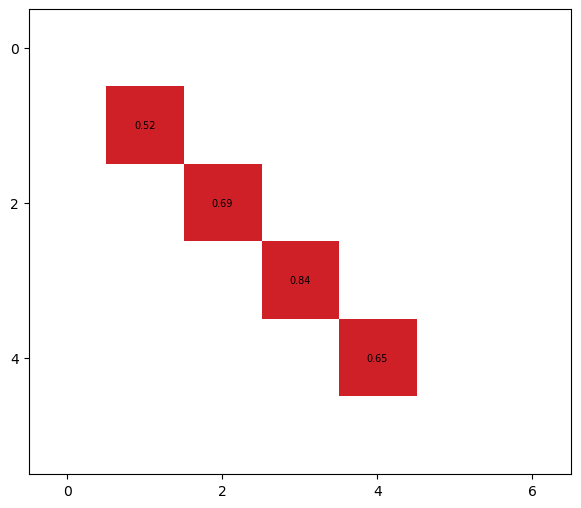

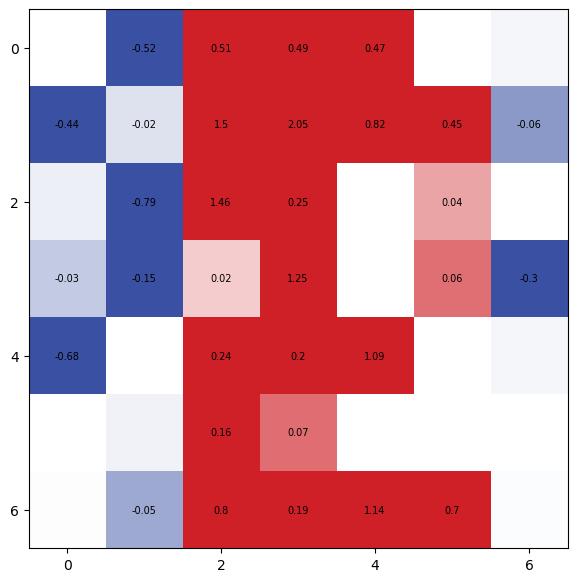

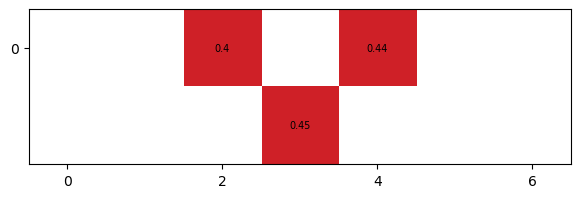

In [839]:
mat = W_inp_effective.T
plot_matrix(mat, show_numbers=True, vmin = -0.25, vmax = 0.25)

mat = W_rec_effective
plot_matrix(mat, show_numbers=True, vmin = -0.1, vmax = 0.1)


mat = W_out_effective
plot_matrix(mat, show_numbers=True, vmin = -0.1, vmax = 0.1)


In [840]:
# save the matrices:
latent_circuit_init_dict = {}
latent_circuit_init_dict["W_inp"] = 1*deepcopy(W_inp_effective)
latent_circuit_init_dict["W_rec"] = 1*deepcopy(W_rec_effective)
latent_circuit_init_dict["W_out"] = 1*deepcopy(W_out_effective)
latent_circuit_init_dict["Q"] = deepcopy(Q)
latent_circuit_init_dict["dt"] = dt
latent_circuit_init_dict["tau"] = tau
latent_circuit_init_dict["N"] = N
pickle.dump(latent_circuit_init_dict, open(f"../data/latent_circuit_init_{RNN_folder}.pkl", "wb+"))

In [841]:
# set up torch RNN
s = 0.8
coherences = np.linspace(-1, 1, 9)
circuit = RNN_numpy(N=W_rec_effective.shape[0],
                dt=dt, tau=tau,
                W_inp=s*W_inp_effective,
                W_rec=s*W_rec_effective,
                W_out=s*W_out_effective,
                activation=activation_numpy)
task = TaskCDDM(n_steps=n_steps, n_inputs=input_size, n_outputs=output_size, task_params=task_params_)
inputs, targets, conditions = task.get_batch()

In [842]:
PerformanceAnalyzer = PerformanceAnalyzerCDDM(circuit)
psycho_data = PerformanceAnalyzer.calc_psychometric_data(task, mask,
                                                         num_levels=len(coherences), 
                                                         num_repeats=11, sigma_rec=0.03, sigma_inp=0.03)

In [843]:
scoring_function = lambda x, y: np.mean((x-y)**2)
input_batch, target_batch, _ = task.get_batch()
PerformanceAnalyzer.get_validation_score(scoring_function=scoring_function, input_batch=input_batch, target_batch=target_batch, mask=mask, sigma_inp=0, sigma_rec=0)

0.1661005790309193

Plotting random trials


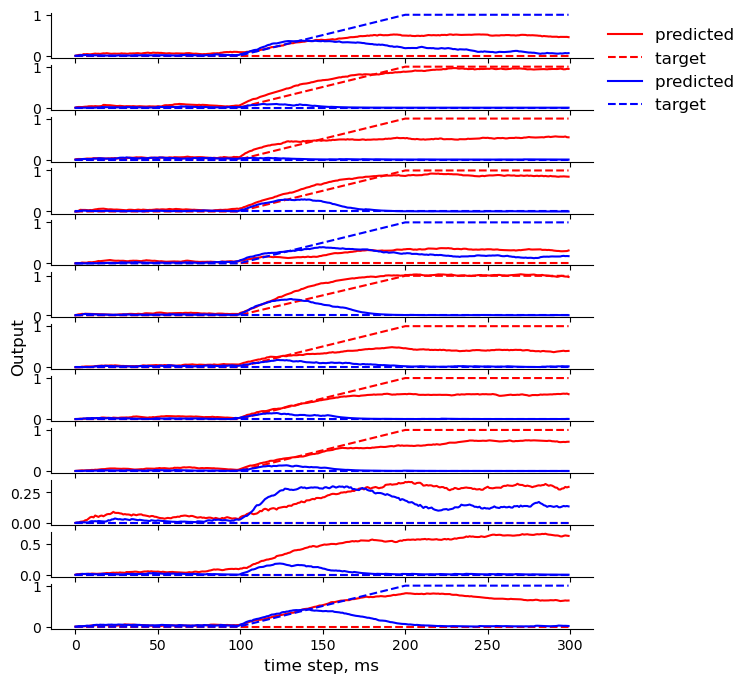

In [844]:
print(f"Plotting random trials")
inds = np.random.choice(np.arange(input_batch.shape[-1]), 12)
inputs = input_batch[..., inds]  
targets = target_batch[..., inds]

PerformanceAnalyzer.plot_trials(inputs, targets, mask)
plt.show()

process the matrix further and use as an initial value for latent circuit fitting!

# checking out Tanh networks!

In [153]:
projects_folder = str(Path.home()) + "/Documents/GitHub/"
RNN = '0.0018708_CDDM_tanh;tanh;N=100;lmbdo=0.3;lmbdr=0.5;lr=0.002;maxiter=3000'
RNN_folder = RNN
RNNs_path = os.path.join(projects_folder, "rnn_coach", "data", "trained_RNNs", "CDDM_tanh")
RNN_score = float(RNN.split("_")[0])
RNN_path = os.path.join(RNNs_path, RNN)
rnn_config = json.load(open(os.path.join(RNN_path, f"{RNN_score}_config.json"), "rb+"))
rnn_data = json.load(open(os.path.join(RNN_path, f"{RNN_score}_params_CDDM_tanh.json"), "rb+"))
train_config_file = f"train_config_CDDM_relu.json"

activation_name = rnn_config["activation"]
RNN_N = rnn_config["N"]
n_steps = rnn_config["n_steps"]
task_params = rnn_config["task_params"]
activation_torch = lambda x: torch.tanh(x)
dt = rnn_config["dt"]
tau = rnn_config["tau"]
connectivity_density_rec = rnn_config["connectivity_density_rec"]
spectral_rad = rnn_config["sr"]
sigma_inp = 0.03
sigma_rec = 0.03
seed = np.random.randint(1000000)


print(f"seed: {seed}")
device = torch.device('cpu')
rng = torch.Generator(device=torch.device(device))
if not seed is None:
    rng.manual_seed(seed)
input_size = np.array(rnn_data["W_inp"]).shape[1]
output_size = np.array(rnn_data["W_out"]).shape[0]
mask = np.array(rnn_config["mask"])

seed: 647111


In [154]:
dt = rnn_data["dt"]
tau = rnn_data["tau"]

N = rnn_data["N"]
W_inp = np.array(rnn_data["W_inp"])
W_rec = np.array(rnn_data["W_rec"])
W_out = np.array(rnn_data["W_out"])
print(W_out.shape)
data_dict = pickle.load(open(os.path.join("../", "data", "pruned_params_tanh_10nrns.pkl"), "rb+"))
W_inp = np.array(data_dict["W_inp"])
W_rec = np.array(data_dict["W_rec"])
W_out = np.array(data_dict["W_out"])
N = W_rec.shape[0]
print(N)
activation_numpy = lambda x: np.tanh(0, x)

(1, 100)
10


In [155]:
task_params_ = deepcopy(task_params)
task_params_["coherences"] = np.array([-0.8, -0.5, -0.2, -0.1, 0, 0.1, 0.2, 0.5, 0.8])
# task_params_["coherences"] = np.array([-0.8, 0, 0.8])

In [156]:
# set up torch RNN
activation_numpy = lambda x: np.tanh(x)
RNN = RNN_numpy(N=N,
                dt=dt, tau=tau,
                W_inp=W_inp,
                W_rec=W_rec,
                W_out=W_out,
                activation=activation_numpy)
task = TaskCDDM_tanh(n_steps=n_steps, n_inputs=input_size, n_outputs=output_size, task_params=task_params_)
inputs, targets, conditions = task.get_batch()

In [158]:
F_connectivity = np.zeros((N, 2*N + 2 + 4))    
for i in range(N):
    F_connectivity[i, :] = np.concatenate([W_rec[:, i], W_rec[i, :], W_out[:, i], W_inp[i, :]])

In [159]:
RNN.clear_history()        
RNN.run(inputs, sigma_rec=0, sigma_inp=0)
traces = RNN.get_history()
cue_on = task_params["cue_on"]
cue_off = task_params["cue_off"]
stim_on = task_params["stim_on"]
stim_off = task_params["stim_off"]
dec_on = task_params["dec_on"]
dec_off = task_params["dec_off"]
times = np.unique([cue_on, cue_off, stim_on, stim_off, dec_on, dec_off])
times.sort()


F_activity = np.stack([np.mean(traces[:, times[0]:times[1], :], axis=1),
                       np.mean(traces[:, times[1]:times[2], :], axis=1),
                       np.mean(traces[:, times[2]:times[3], :], axis=1)], axis = 1)
F_activity = np.hstack([F_activity[:, i, :] for i in range(F_activity.shape[1])])
# k = len(task_params_["coherences"])**2
# mean_cue_on = np.hstack([np.mean(np.mean(traces[:, times[0]:times[1], :], axis=1)[:, :k], axis = -1).reshape(-1, 1),
#                          np.mean(np.mean(traces[:, times[0]:times[1], :], axis=1)[:, k:], axis=-1).reshape(-1, 1)])
# F_activity = np.stack([np.mean(traces[:, times[1]:times[2], :], axis=1),
#                        np.mean(traces[:, times[2]:times[3], :], axis=1)], axis = 1)
# F_activity = np.hstack([F_activity[:, i, :] for i in range(F_activity.shape[1])])
# F_activity = np.hstack([mean_cue_on, F_activity])

In [160]:
F = np.hstack([F_activity, F_connectivity])
F_z = zscore(F, axis = 0)

In [161]:

F_z_activity = zscore(F_activity, axis = 0)
F_z_connectivity = zscore(F_connectivity, axis = 0)
# F_z = np.hstack([F_z_activity, F_z_connectivity])
F_z = deepcopy(F_z_activity)

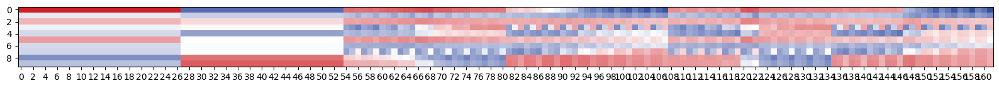

In [162]:
plot_matrix(F_z[:, ::3], figsize=(20, 5))

In [163]:
L = 12
num_rep = 11
sill_score_array = np.zeros((L-3, num_rep))
for i in tqdm(range(3, L)):
    for j in range(num_rep):
        clusterer = KMeans(n_clusters = i)
        labels = clusterer.fit_predict(F_z)
        sill_score_array[i-3, j] = deepcopy(silhouette_score(F_z, labels))
sill_scores = np.mean(sill_score_array, axis=1)

  0%|          | 0/9 [00:00<?, ?it/s]

ValueError: Number of labels is 10. Valid values are 2 to n_samples - 1 (inclusive)

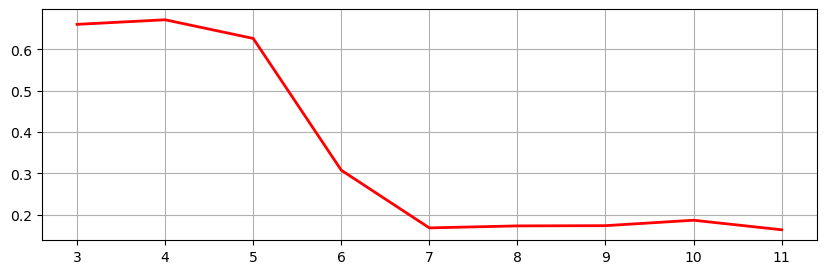

In [164]:
fig, ax = plt.subplots(figsize = (10, 3))
ax.plot(sill_scores, linewidth=2, color='r')
ax.set_xticks(np.arange(L-3))
ax.set_xticklabels(labels = np.arange(3, L))
plt.grid(True)
plt.show()

In [165]:
clusterer = KMeans(n_clusters=5)
labels = clusterer.fit_predict(F_z)

In [166]:
# for i in np.unique(labels):
#     plot_matrix(F_z_activity[np.where(labels == i)[0],:])
#     plot_matrix(F_z_connectivity[np.where(labels == i)[0],:])

In [167]:
# need to write good plotly library which 

In [168]:
from sklearn.decomposition import PCA
pca = PCA(n_components=5)
pca.fit(F_z)
F_z_pca = (F_z @ pca.components_.T)

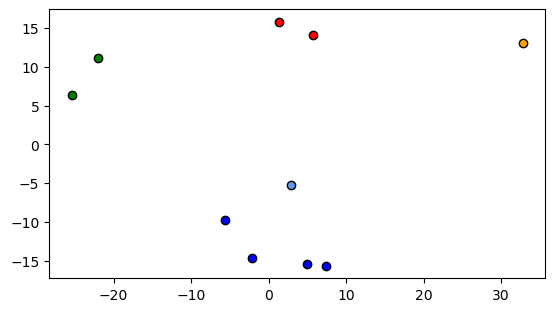

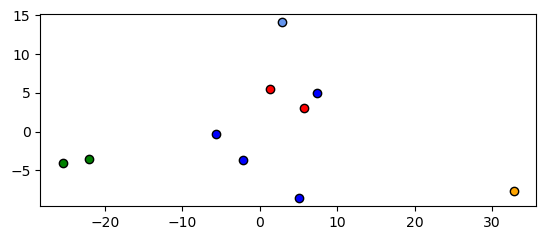

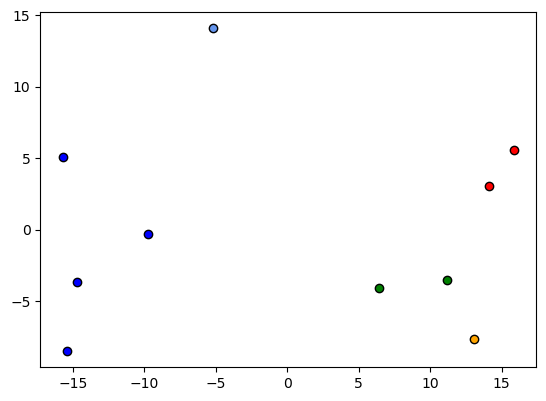

In [169]:
colors = ["g", 'b', 'r', "cornflowerblue", "orange", "m", "y", "k", "violet", "deepskyblue"]
fig, ax = plt.subplots(1, 1)
for i in (np.unique(labels)):
    cluster = np.where(labels == i)[0]
    ax.scatter(F_z_pca[cluster, 0], F_z_pca[cluster, 1], marker='o', color=colors[i], edgecolors='k')
ax.axes.set_aspect('equal')
plt.show()

fig, ax = plt.subplots()
for i in (np.unique(labels)):
    cluster = np.where(labels == i)[0]
    ax.scatter(F_z_pca[cluster, 0], F_z_pca[cluster, 2], marker='o', color=colors[i], edgecolors='k')
ax.axes.set_aspect('equal')
plt.show()

fig, ax = plt.subplots()
for i in (np.unique(labels)):
    cluster = np.where(labels == i)[0]
    ax.scatter(F_z_pca[cluster, 1], F_z_pca[cluster, 2], marker='o', color=colors[i], edgecolors='k')
ax.axes.set_aspect('equal')
plt.show()

[-0.4574059   1.25359466 -0.33342164 -0.34756199]
1


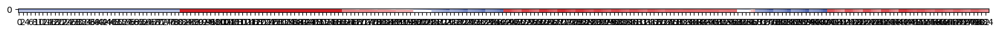

[-0.4574059  -0.21602245 -0.33322293  0.52134299]
3


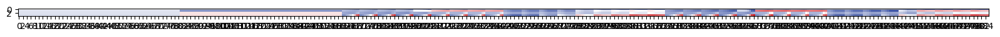

[ 0.15144257 -0.41077488 -0.33342164 -0.34756199]
1000


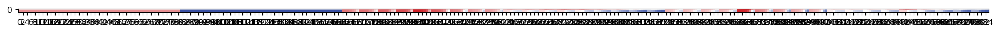

[-0.4574059  -0.41077488  2.99999992 -0.34756199]
2


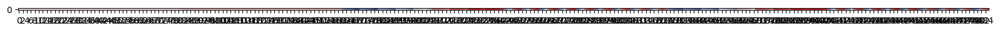

[ 2.89895614 -0.41077488 -0.33342164 -0.34756199]
0


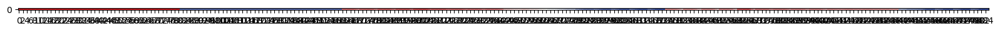

In [170]:
th = 0.3
label_dict = dict()
for i in range(4):
    label_dict[i] = []
label_dict[1000] = []
    
for i in np.unique(labels):
    row = np.mean(F_z_connectivity[:, -4:][np.where(labels == i)[0],:], axis = 0)
    print(row)
    row = row * (row > th)

    if np.max(row) == 0:
        inp_ind = 1000
    else:
        inp_ind = np.argmax(row)
    print(inp_ind)
    plot_matrix(F_z_activity[:, :][np.where(labels == i)[0],:], figsize = (20, 5))
#     plot_matrix(F_z_connectivity[:, :][np.where(labels == i)[0],:])
    label_dict[inp_ind].append(np.where(labels == i)[0])

{0: [array([0])], 1: [array([8, 9])], 2: [array([3])], 3: [array([1, 4, 6, 7])], 1000: [array([2, 5])]}
[0] 0 r
[8 9] 1 g
[3] 2 b
[1 4 6 7] 3 orange
[2 5] 4 magenta


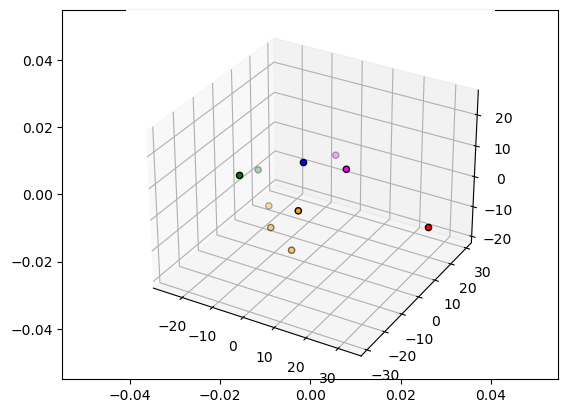

In [171]:
print(label_dict)
# %matplotlib widget
fig = plt.plot()
ax = plt.axes(projection='3d')
cnt = 0
colors = ['r', 'g', 'b', 'orange', 'magenta', 'deepskyblue', 'salmon']
for key in label_dict.keys():
    for i in range(len(label_dict[key])):
        cluster = label_dict[key][i]
        print(cluster, cnt, colors[cnt])
        ax.scatter(F_z_pca[cluster, 0], F_z_pca[cluster, 1], F_z_pca[cluster, 2], marker='o', color=colors[cnt], edgecolors='k')
        cnt+=1
ax.axes.set_aspect('equal')
plt.show()


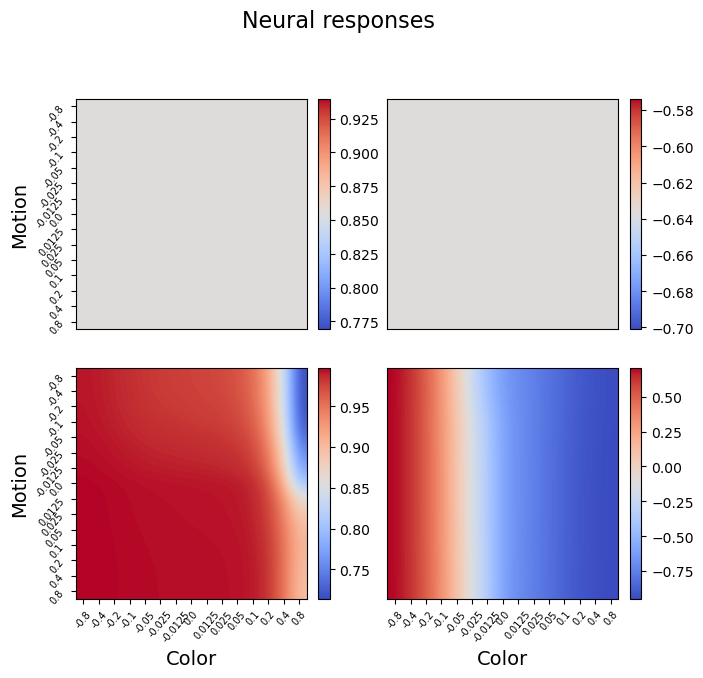

In [172]:
# set up torch RNN
RNN = RNN_numpy(N=N,
                dt=dt, tau=tau,
                W_inp=W_inp,
                W_rec=W_rec,
                W_out=W_out,
                activation=activation_numpy)
task = TaskCDDM_tanh(n_steps=n_steps, n_inputs=input_size, n_outputs=output_size, task_params=task_params)
inputs, targets, conditions = task.get_batch()
RNN.clear_history()        
RNN.run(inputs, sigma_rec=0, sigma_inp=0)
traces = RNN.get_history()

for i in label_dict[0][0]:
    plot_neurons_stats(traces[i, ...].T, conditions=conditions, task_params=task_params)

In [173]:
keys = list(label_dict.keys())
keys.sort()
order = np.array([])
labels = np.zeros(N).astype(int)
c = 0
for key in keys:
    for i in range(len(label_dict[key])):
        labels[label_dict[key][i]] = int(c)
        order = np.append(order, label_dict[key][i])
        c += 1
order = order.astype("int")

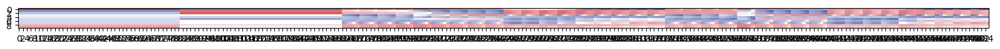

In [174]:
F_z_permuted = permute_input_matrix(F_z, order)
plot_matrix(F_z_permuted[:, :], figsize = (20, 5))

In [175]:
W_inp_permuted = permute_input_matrix(W_inp, order)
W_rec_permuted = permute_recurrent_matrix(W_rec, order)
W_out_permuted = permute_output_matrix(W_out, order)

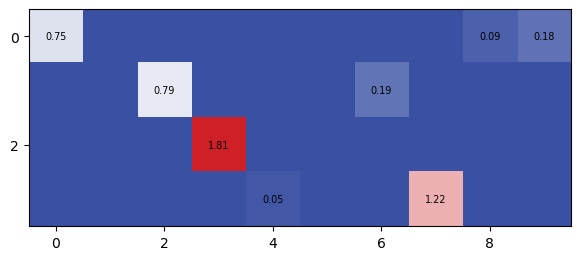

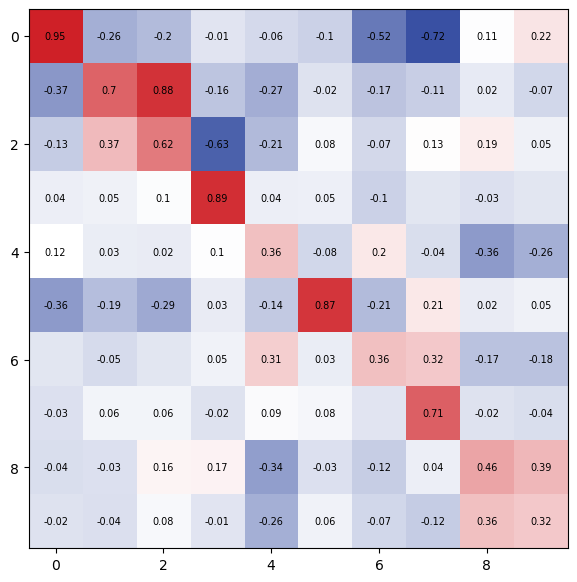

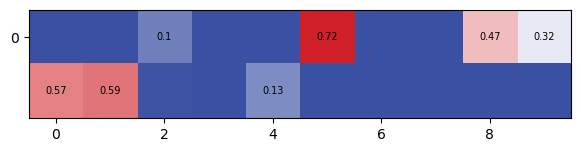

In [177]:
plot_matrix(W_inp_permuted.T, show_numbers=True)
plot_matrix(W_rec_permuted, show_numbers=True)
plot_matrix(W_out_permuted, show_numbers=True)

In [178]:
# clusters = ["1", '2','3',"4", "5", "6", "7", "8", "9", "10"]
# W_rec_effective = np.zeros((len(clusters), len(clusters)))
# for i, cluster1 in enumerate(clusters):
#     for j, cluster2 in enumerate(clusters):
#         inds_cluster1 = np.where(labels == clusters.index(cluster1))[0]
#         inds_cluster2 = np.where(labels == clusters.index(cluster2))[0]
#         mat = take_elements(W_rec, inds_cluster1, inds_cluster2)
#         mat_thresholded = mat * (mat > np.percentile(mat, 25))
#         W_rec_effective[i, j] = np.sum(mat_thresholded)
        
# W_inp_effective = np.zeros((len(clusters), 4))
# for i, cluster1 in enumerate(clusters):
#     for j in np.arange(4):
#         inds_cluster1 = np.where(labels == clusters.index(cluster1))[0]
#         mat = W_inp[inds_cluster1, j]
#         mat_thresholded = mat * (mat > np.percentile(mat, 25))
#         W_inp_effective[i, j] = np.sum(mat_thresholded)
        
# W_out_effective = np.zeros((2, len(clusters)))
# for i in np.arange(2):
#     for j, cluster1 in enumerate(clusters):
#         inds_cluster1 = np.where(labels == clusters.index(cluster1))[0]
#         mat = W_out_permuted[i, inds_cluster1]
#         mat_thresholded = mat * (mat > np.percentile(mat, 25))
#         W_out_effective[i, j] = np.sum(mat_thresholded)
        
# cnt = 0
# Q = np.zeros((N, len(clusters)))
# for key in label_dict.keys():
#     for i in range(len(label_dict[key])):
#         Q[label_dict[key][i], cnt] = 1
#         Q[:, cnt] /= np.linalg.norm(Q[:, cnt])
#         cnt+=1

In [179]:
# fig, ax = plt.subplots(1, 3, figsize = (12, 6))

# mat = W_inp_effective.T
# img = ax[0].imshow(mat, cmap=cmp)
# for (i, j), z in np.ndenumerate(mat):
#     if np.abs(z) > 0.005:
#         ax[0].text(j, i, str(np.round(z, 2)), ha="center", va="center", color='k', fontsize=7)
# ax[0].set_xticks(np.arange(mat.shape[1]))
# ax[0].set_yticks(np.arange(mat.shape[0]))
# ax[0].set_xticklabels(clusters, rotation=80, fontsize=12)
# # ax[0].set_yticklabels(clusters, rotation=0, fontsize=12)

# mat = W_rec_effective
# img = ax[1].imshow(mat, cmap=cmp)
# for (i, j), z in np.ndenumerate(mat):
#     if np.abs(z) > 0.005:
#         ax[1].text(j, i, str(np.round(z, 2)), ha="center", va="center", color='k', fontsize=7)
# ax[1].set_xticks(np.arange(mat.shape[1]))
# ax[1].set_yticks(np.arange(mat.shape[0]))
# ax[1].set_xticklabels(clusters, rotation=80, fontsize=12)
# ax[1].set_yticklabels(clusters, rotation=0, fontsize=12)

# mat = W_out_effective
# img = ax[2].imshow(mat, cmap=cmp)
# for (i, j), z in np.ndenumerate(mat):
#     if np.abs(z) > 0.005:
#         ax[2].text(j, i, str(np.round(z, 2)), ha="center", va="center", color='k', fontsize=7)
# ax[2].set_xticks(np.arange(mat.shape[1]))
# ax[2].set_yticks(np.arange(mat.shape[0]))
# ax[2].set_xticklabels(clusters, rotation=80, fontsize=12)
# # ax[2].set_yticklabels(clusters, rotation=0, fontsize=12)
# plt.subplots_adjust(wspace=0.4)
# plt.show()


In [180]:
# fig, ax = plt.subplots(1, 1, figsize = (10, 40))
# mat = W_out.T
# img = ax.imshow(mat, cmap=cmp, vmin = -0.4, vmax = 0.4)
# for (i, j), z in np.ndenumerate(mat):
#     if np.abs(z) > 0.005:
#         ax.text(j, i, str(np.round(z, 2)), ha="center", va="center", color='k', fontsize=7)
# ax.set_xticks(np.arange(mat.shape[1]))
# ax.set_yticks(np.arange(mat.shape[0]))
# plt.show()

In [185]:
circuit = RNN_numpy(N=W_rec_permuted.shape[0],
                dt=dt, tau=tau,
                W_inp=W_inp_permuted,
                W_rec=W_rec_permuted,
                W_out=W_out_permuted,
                activation=activation_numpy)
task = TaskCDDM_tanh(n_steps=n_steps, n_inputs=input_size, n_outputs=2, task_params=task_params)
inputs, targets, conditions = task.get_batch()

In [186]:
# coherences = np.array([-0.8, -0.4, 0, 0.4, 0.8])

PerformanceAnalyzer = PerformanceAnalyzerCDDM(circuit)
psycho_data = PerformanceAnalyzer.calc_psychometric_data(task, mask,
                                                         num_levels=len(task_params["coherences"]), 
                                                         num_repeats=11, sigma_rec=0.03, sigma_inp=0.03)

In [187]:
scoring_function = lambda x, y: np.mean((x-y)**2)
input_batch, target_batch, _ = task.get_batch()
PerformanceAnalyzer.get_validation_score(scoring_function=scoring_function, input_batch=input_batch, target_batch=target_batch, mask=mask, sigma_inp=0, sigma_rec=0)

0.020760122699874303

Plotting random trials


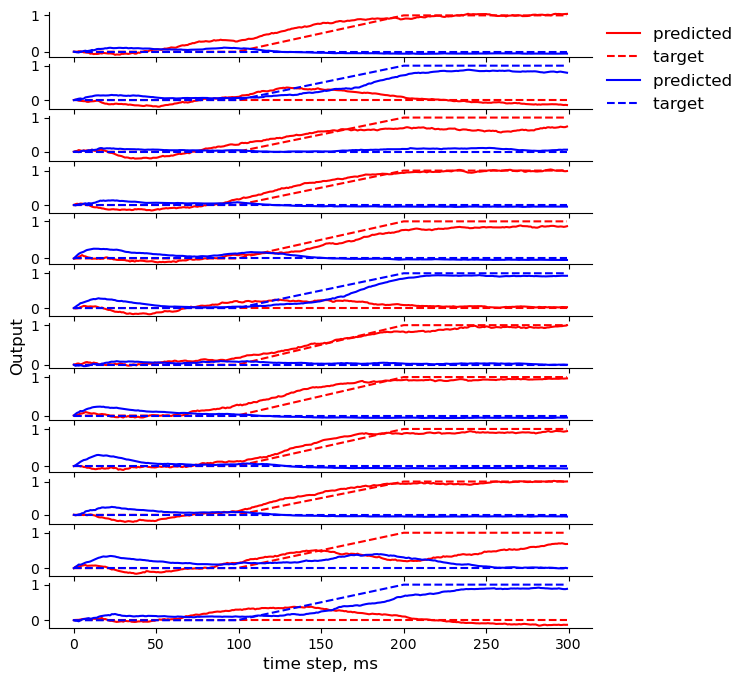

In [188]:
print(f"Plotting random trials")
inds = np.random.choice(np.arange(input_batch.shape[-1]), 12)
inputs = input_batch[..., inds]  
targets = target_batch[..., inds]

PerformanceAnalyzer.plot_trials(inputs, targets, mask)
plt.show()

In [189]:
psycho_data = PerformanceAnalyzer.calc_psychometric_data(task, mask,
                                                         num_levels=len(task_params["coherences"]), 
                                                         num_repeats=11, sigma_rec=0.03, sigma_inp=0.03)

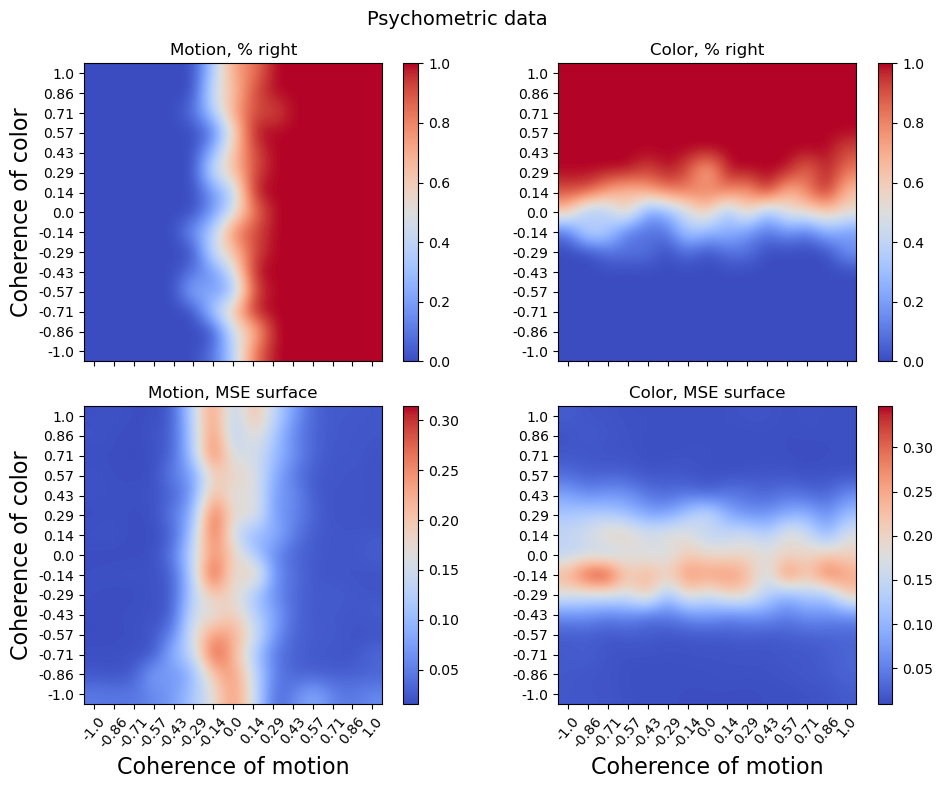

In [190]:
PerformanceAnalyzer.plot_psychometric_data()
plt.show()